<a href="https://colab.research.google.com/github/yesong98/Exploration/blob/main/Exploration11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 프로젝트 : CIFAR-10 이미지 생성하기
GAN을 학습하는 과정은 보기보다 까다롭습니다. 모델 구조, learning_rate, 파라미터 초기화, 생성자와 판별자의 경쟁 관계, 데이터의 특성 등 고려해야 할 것이 참 많습니다.  

이번에는 앞에서 배운 FASHION-MNIST 데이터 생성용 DCGAN 모델구조를 이용해서 CIFAR-10 데이터를 생성하는 모델을 직접 만들어 봅시다.  
모델 구현 및 학습의 전과정의 흐름은 거의 비슷하겠지만, 아래와 같이 몇 가지 달라지는 점이 있습니다.

- 이미지 데이터의 shape가 (28, 28, 1)에서 (32, 32, 3)으로 변경됩니다. 생성자, 판별자 모델의 입출력 shape 및 모델 구조에 영향이 있습니다.
- 이미지가 단색의 grayscale에서 RGB 3채널의 컬러이미지로 변경됩니다. 시각화 과정에서 고려할 점이 있습니다.
- 입력데이터 전체 차원이 3~4배 증가하면서, 학습이 진행되는 양상이 다소 달라집니다.  
우선 주요 라이브러리 버전을 확인하고 진행합시다.





>## 루브릭
1. GAN의 두 모델 구조를 통해 이미지를 성공적으로 생성하였다.   
- 오브젝트 종류를 육안으로 구별할 수 있을 만한 이미지를 생성하였다.
2. 생성 이미지 시각화 및 학습 그래프를 통해 GAN 학습이 바르게 진행되었음을 입증하였다.  
- gif를 통해 생성이미지 품질이 서서히 향상되는 것과, fake accuracy가 추세적으로 0.5를 향해 하향하고 있음을 확인하였다.
3. 추가적인 GAN 모델구조 혹은 학습과정 개선 아이디어를 제안하고 이를 적용하였다.   
- 모델구조 변경 혹은 학습과정 개선 아이디어를 추가적으로 적용해보았고, 적용 전과 비교하였을 때의 내용을 표와 같은 시각적 자료로 작성하였다.



# STEP 1. 작업환경 구성하기
- 다음과 같이 작업환경을 구성합시다.

In [1]:
import tensorflow as tf
import imageio
import os
import glob
import time

import PIL
import numpy as np
from tensorflow.keras import layers
from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# STEP 2. 데이터셋 구성하기
- CIFAR-10 데이터셋도 tf.keras 안에 있는 datasets에 포함되어 있어서, 아래와 같이 손쉽게 데이터셋을 구성할 수 있습니다.

In [2]:
cifar10 = tf.keras.datasets.cifar10

(train_x, _), (test_x, _) = cifar10.load_data()

train_x.shape

170508288/170498071 [==============================] - 11s 0us/step


(50000, 32, 32, 3)

In [3]:
print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 255
min pixel: 0


- 학습에 사용할 train_x의 이미지를 -1, 1로 정규화합니다.
- 로드한 학습 데이터를 시각화를 통해 확인해 봅시다.
- tf.data.Dataset 모듈의 from_tensor_slices() 함수를 사용하여 미니배치 데이터셋을 구성해 봅시다.  

In [4]:
#정규화
train_x = (train_x - 127.5) / 127.5 # 이미지를 [-1, 1]로 정규화합니다.

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 1.0
min pixel: -1.0


In [5]:
train_x.shape

(50000, 32, 32, 3)

In [6]:
train_x = train_x.reshape(train_x.shape[0], 32, 32, 3).astype('float32')
train_x.shape

(50000, 32, 32, 3)

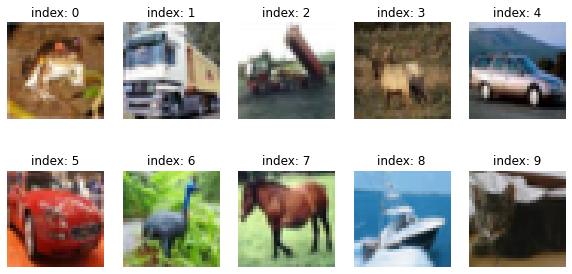

In [7]:
#로드한 학습데이터 시각화로 10개 이미지 확인
plt.figure(figsize=(10, 5))

for i in range(10): 
    plt.subplot(2, 5, i+1)
    plt.imshow((train_x[i] + 1) / 2.0)
    plt.title(f'index: {i}')
    plt.axis('off')
plt.show()

In [8]:
BUFFER_SIZE = 50000
BATCH_SIZE = 256

In [9]:
#미니배치 데이터셋 구성(tf.data.Dataset 모듈의 from_tensor_slices() 함수를 사용)
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# STEP 3. 생성자 모델 구현하기
- (32, 32, 3)의 shape를 가진 이미지를 생성하는 생성자 모델 구현 함수를 작성해 봅시다.
- noise = tf.random.normal([1, 100])로 생성된 랜덤 노이즈를 입력으로 하여 방금 구현한 생성자로 랜덤 이미지를 생성해 봅시다.
- 생성된 랜덤 이미지가 생성자 출력 규격에 잘 맞는지 확인해 봅시다.

In [10]:
#GAN모델 구현하기
def make_generator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Dense layer
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Second: Reshape layer
    model.add(layers.Reshape((8, 8, 256)))

    # Third: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Fourth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Fifth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh'))

    return model

In [11]:
# 생성 모델을 generator라는 변수로 생성
generator = make_generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16384)             1638400   
                                                                 
 batch_normalization (BatchN  (None, 16384)            65536     
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 16384)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 128)        819200    
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 8, 8, 128)        5

In [12]:
# 노이즈 벡터
noise = tf.random.normal([1, 100])

In [13]:
generated_image = generator(noise, training=False)
generated_image.shape

TensorShape([1, 32, 32, 3])

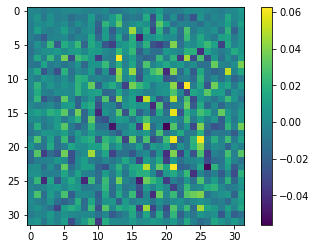

In [14]:
#시각화
plt.imshow(generated_image[0, :, :, 0])
plt.colorbar()
plt.show()

# STEP 4. 판별자 모델 구현하기
- (32, 32, 3)의 이미지를 입력으로 받아 1dim을 판별결과를 출력하는 판별자 모델 구현 함수를 작성해 봅시다.
- 위 STEP 2에서 생성한 랜덤 이미지를 판별자 모델이 판별한 결과값을 확인해 봅시다.

In [15]:
#1dim을 판별결과를 출력하는 판별자 모델 구현 함수
def make_discriminator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Conv2D Layer
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.4))

    # Second: Conv2D Layer
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.4))

    # Third: Flatten Layer
    model.add(layers.Flatten())

    # Fourth: Dense Layer
    model.add(layers.Dense(1))

    return model

In [16]:
discriminator = make_discriminator_model()

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 16, 64)        4864      
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 16, 16, 64)        0         
                                                                 
 dropout (Dropout)           (None, 16, 16, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 8, 8, 128)         204928    
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 dropout_1 (Dropout)         (None, 8, 8, 128)         0         
                                                                 
 flatten (Flatten)           (None, 8192)             

In [17]:
#결과값
decision = discriminator(generated_image, training=False)
decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.00134265]], dtype=float32)>

# STEP 5. 손실함수와 최적화 함수 구현하기
- 생성자와 판별자의 손실함수(loss)를 구현해 봅시다.
- 판별자의 출력값을 가지고 실제/생성(real/fake) 이미지 판별 정확도(accuracy)를 계산하는 함수를 구현해 봅시다.
- 생성자와 판별자를 최적화하는 optimizer를 정의합니다.

In [18]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [19]:
#generator_loss
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [20]:
#discriminator_loss
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [21]:
#discriminator accuracy
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

In [22]:
#optimizer
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [23]:
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([16, 100])

# STEP 6. 훈련과정 상세 기능 구현하기
- 1개 미니배치의 훈련 과정을 처리하는 train_step() 함수를 구현해 봅시다.
- 16개의 고정된 seed를 입력으로 하여 훈련 과정 동안 생성한 이미지를 시각화하는 generate_and_save_images() 함수를 구현해 봅시다.
- 훈련 epoch마다 생성자/판별자의 loss 및 판별자의 실제/생성(real/fake) 이미지 판별 accuracy 히스토리(history)를 그래프로 시각화하는 draw_train_history() 함수를 구현해 봅시다.
- training_checkpoints 디렉토리에 몇 epoch마다 모델을 저장하는 checkpoint 모듈을 설정해 봅시다.


In [24]:
#trin_step()함수 구현
@tf.function
def train_step(images):  #(1) 입력데이터
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  #(2) 생성자 입력 노이즈

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈
        generated_images = generator(noise, training=True)  #(4) generated_images 생성

        #(5) discriminator 판별
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8) gradient 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9) 모델 학습
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10) 리턴값

In [25]:
#generate_and_save_images() 함수를 구현
def generate_and_save_images(model, epoch, it, sample_seeds):

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i] + 1)/2.0)
        plt.axis('off')
   
    plt.savefig('/content/drive/MyDrive/aiffel/dcgan_newimage/cifar10/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format( epoch, it))

    plt.show()

In [26]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6    # matlab 차트의 기본 크기를 15,6으로 지정해 줍니다.

#draw_train_history() 함수를 구현
def draw_train_history(history, epoch):
    # summarize history for loss  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    plt.savefig('/content/drive/MyDrive/aiffel/dcgan_newimage/cifar10/training_history/train_history_{:04d}.png'
                    .format(epoch))
    plt.show()

In [27]:
#checkpoint 모듈을 설정

In [28]:
checkpoint_dir = '/content/drive/MyDrive/aiffel/dcgan_newimage/cifar10/training_checkpoints'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# STEP 7. 학습 과정 진행하기
- 위 STEP 5에서 구현한 기능들을 활용하여 최소 50 epoch만큼의 모델 학습을 진행해 봅시다.
- 학습 과정에서 생성된 샘플 이미지로 만든 gif 파일을 통해 학습 진행 과정을 시각적으로 표현해 봅시다.
- 학습 과정을 담은 샘플 이미지, gif 파일, 학습 진행 그래프 이미지를 함께 제출합니다.  


In [29]:
def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)

In [30]:
save_every = 5
EPOCHS = 50

# 사용가능한 GPU 디바이스 확인
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

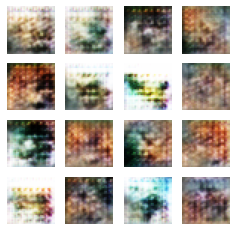

Time for training : 561 sec


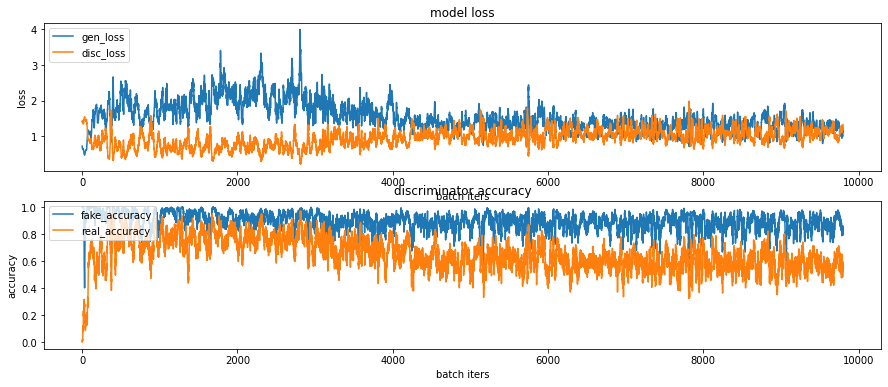

CPU times: user 7min 50s, sys: 14.9 s, total: 8min 5s
Wall time: 9min 23s


In [ ]:
%%time
train(train_dataset, EPOCHS, save_every)

In [36]:
anim_file = '/content/drive/MyDrive/aiffel/dcgan_newimage/cifar10/cifar10_dcgan1.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('/content/drive/MyDrive/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

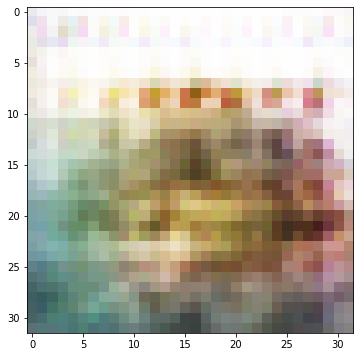

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/aiffel/dcgan_newimage/cifar10/cifar10_dcgan1.gif'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
plt.imshow(np_generated[0])
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

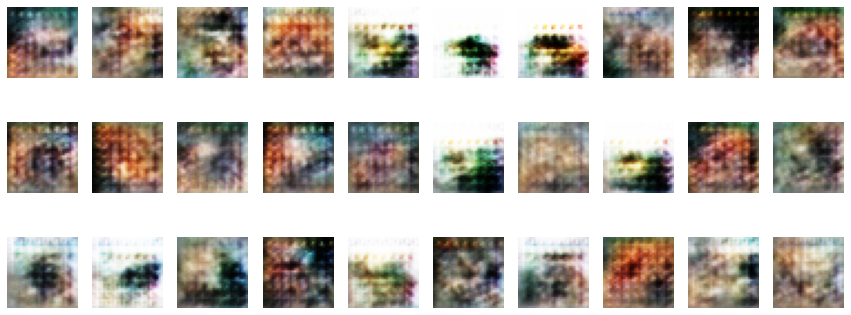

In [ ]:
for i in range(30):
    plt.subplot(3, 10, i+1)
    noise = tf.random.normal([1, 100])
    generated_image = generator(noise, training=False)
    np_generated = generated_image.numpy()
    np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
    np_generated = np_generated.astype(int)
    plt.imshow(np_generated[0])
    plt.axis('off')
plt.show()  

# STEP 8. (optional) GAN 훈련 과정 개선하기
- STEP 6을 진행하면서 생성된 샘플 이미지, 학습 과정 그래프 등을 통해 이전 훈련 과정의 문제점을 분석해 봅시다.
- 모델구조 또는 학습 과정을 개선한 내역과 그 결과(샘플 이미지, 학습 과정 그래프 포함)를 함께 제출합니다

In [ ]:
EPOCHS = 200

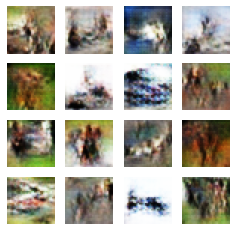

Time for training : 2022 sec


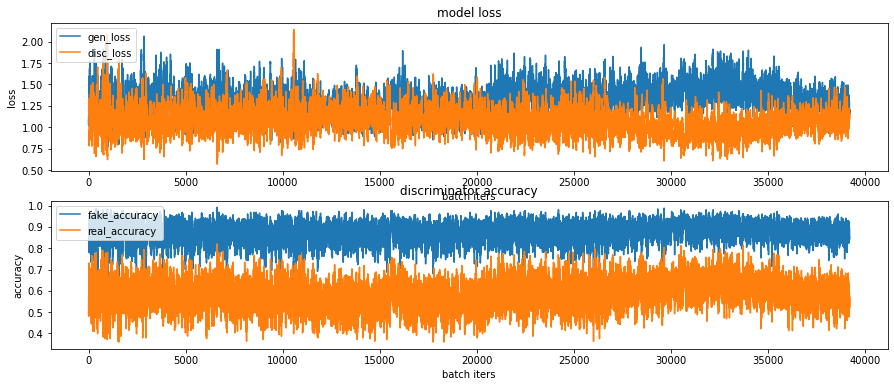

CPU times: user 33min 2s, sys: 57.8 s, total: 34min
Wall time: 33min 44s


In [ ]:
%%time
train(train_dataset, EPOCHS, save_every)

In [35]:
anim_file = '/content/drive/MyDrive/aiffel/dcgan_newimage/cifar10/cifar10_dcgan2.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('/content/drive/MyDrive/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

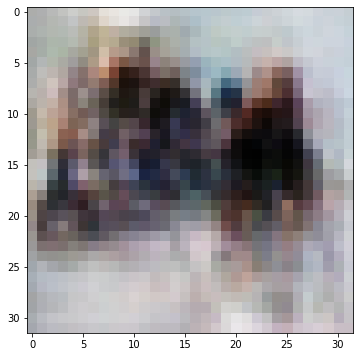

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/aiffel/dcgan_newimage/cifar10/cifar10_dcgan2.gif'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
plt.imshow(np_generated[0])
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

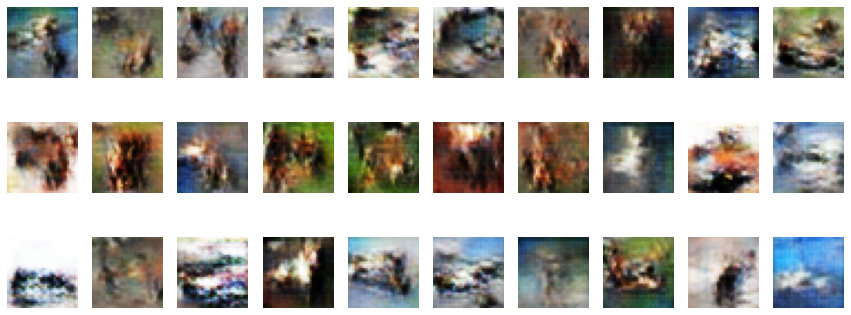

In [ ]:
for i in range(30):
    plt.subplot(3, 10, i+1)
    noise = tf.random.normal([1, 100])
    generated_image = generator(noise, training=False)
    np_generated = generated_image.numpy()
    np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
    np_generated = np_generated.astype(int)
    plt.imshow(np_generated[0])
    plt.axis('off')
plt.show()  

In [31]:
EPOCHS = 500

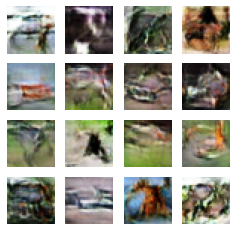

Time for training : 6617 sec


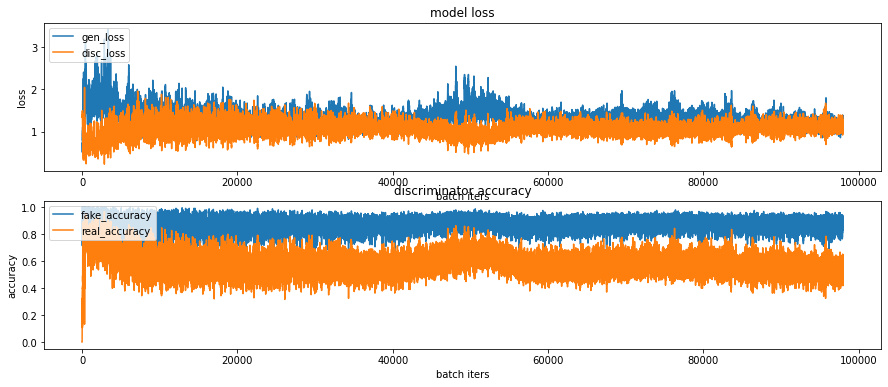

CPU times: user 1h 37min 43s, sys: 2min 23s, total: 1h 40min 6s
Wall time: 1h 50min 21s


In [32]:
%%time
train(train_dataset, EPOCHS, save_every)

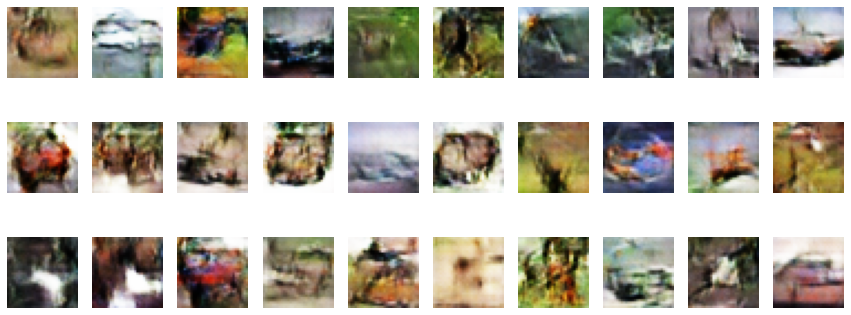

In [33]:
for i in range(30):
    plt.subplot(3, 10, i+1)
    noise = tf.random.normal([1, 100])
    generated_image = generator(noise, training=False)
    np_generated = generated_image.numpy()
    np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
    np_generated = np_generated.astype(int)
    plt.imshow(np_generated[0])
    plt.axis('off')
plt.show() 

# 모델구조 또는 학습 과정을 개선한 내역과 그 결과
### - EPOCH = 50으로 고정한 후 학습과정 개선


## 1) 제일 처음 학습시킨 모델의 결과(익스예제를 프로젝트에 맞게 바꾼 후 실행)
- 제일 처음 실행한 사진이나 GIF는 뒤에 실행시킨 것에 덮어져서 캡쳐한 사진만 몇개 있는 상태이다
- 이제보니 처음 실행한 학습이 그나마 나은 것같기도..?
- 결과
  - 비교적 loss의 값은 1로 수렴하고 있어 좋은 결과를 보였다
  - 그런데 fake_acc의 경우 1~0.7의 값이 나오고 0.5까지 수렴하지 못했다.
  - 이미지 색상은 파랗게 나와서 구분이 잘 되지 않았다.

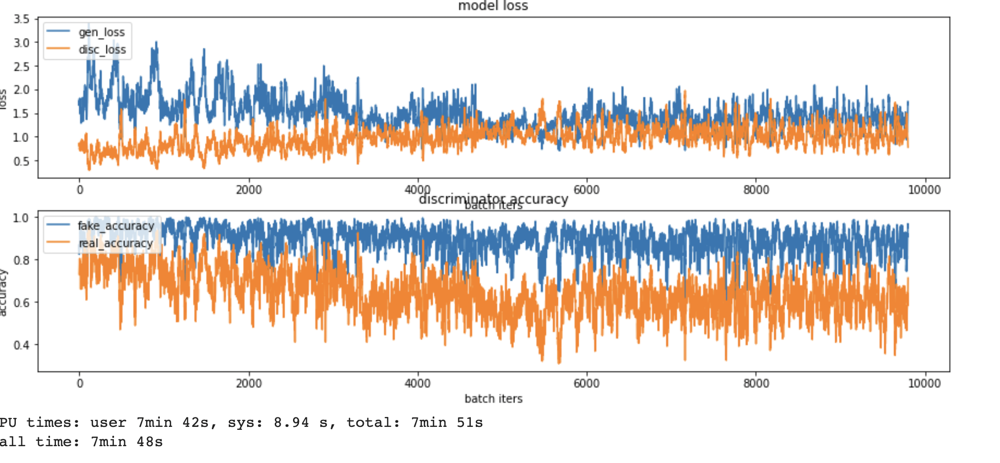

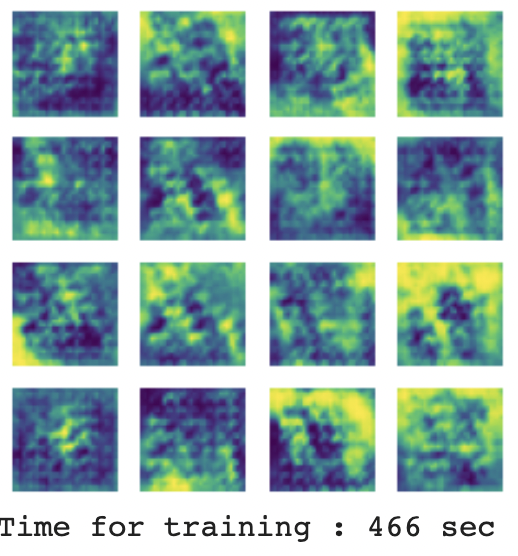

## 1) momentum = 0.9, alpha = 0.1
- dropout= 0.4로 설정한 후 실행시켰다
- 결과
  - loss의 값은 1에 수렴하는 듯 보였다
  - Fake_acc의 경우 0.5까지 수렴하지 않았다
  - 이미지의 색상을 바꾸는 방법을 찾는 중이다.

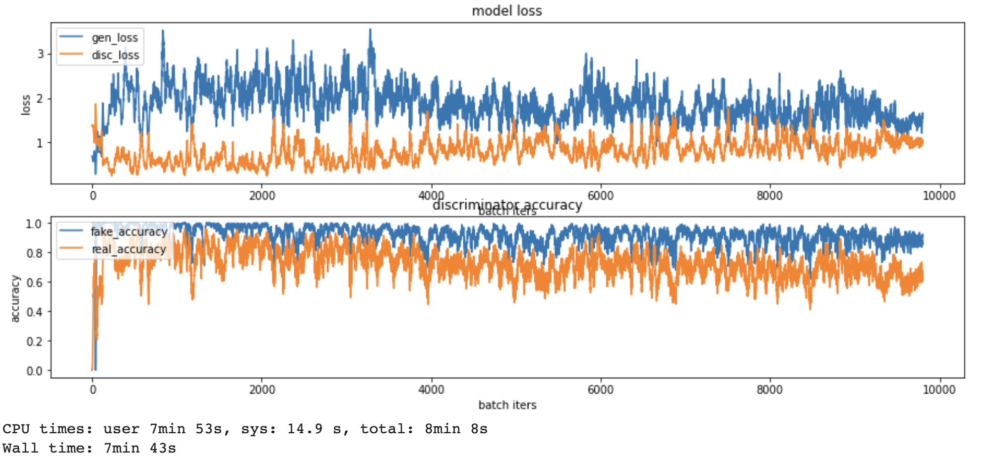

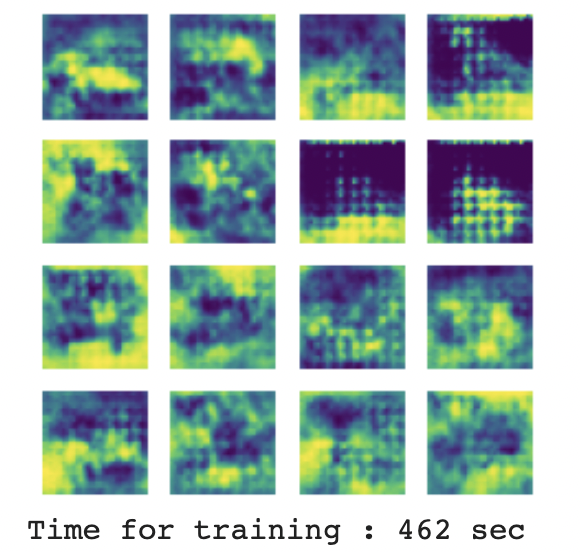

>- 이미지가 초록색(푸른색)으로 나오는 부분을 해결함
```
plt.imshow((pedictions[i,:,:,0]))
```
이였던 부분을
```
plt.imshow((pedictions[i]+1/2.0))
```
으로 변경했다.





## 2) learning rate
- 처음 learning rate = 1e-4였는데 generator_optimizer와 discriminator_optimizer에서 4e-4로 설정했다.
- 결과
  - loss의 값은 약간의 우하향이 보이나 최대,최소값의 구간이 길어 정확히 1에 수렴한다고보기엔 어려웠다
  -fake_acc의 경우 1에서 0.6까지 값을 가지나 0.5로 수렴한다고 보기 어려웠다
  - 이미지 데이터는 처음 모델이 초록색 계열의 사진으로 나와 비교가 되지 않았다.
  - 이미지가 형태가 보인다기 보다 어느쪽에 물체가 있는지 알 수 있는 정도이다.

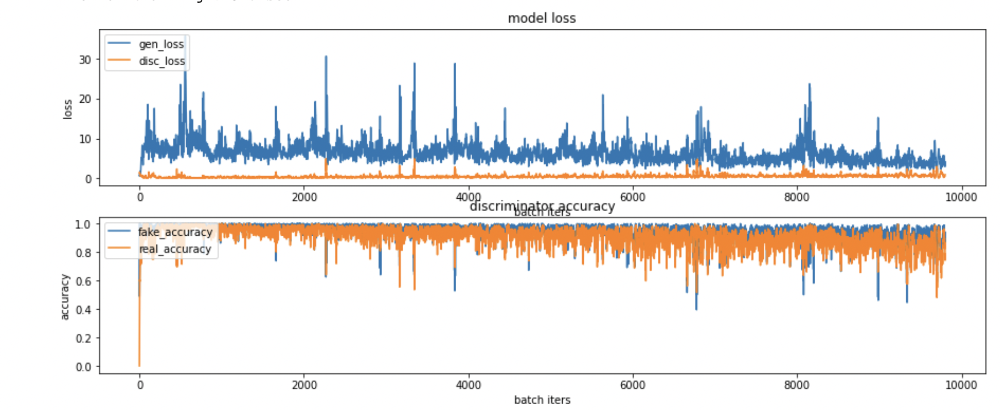

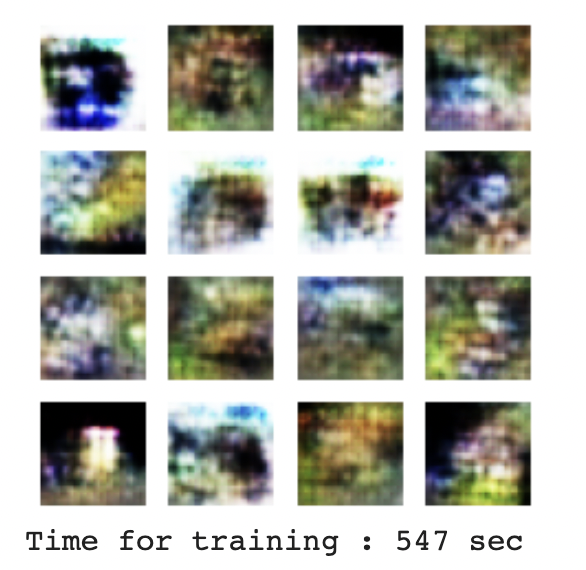

#### learning rate 고정 후 epoch =200로 학습수행

- 결과
  - loss의 경우 1로 수렴하다 gen_loss는 우상향을 보임
  - fake_acc의 경우 0.5로 수렴하지 않음
  - epoch=50일때보다 이미지가 선명해 보이지만 물체를 구분하기 어려움

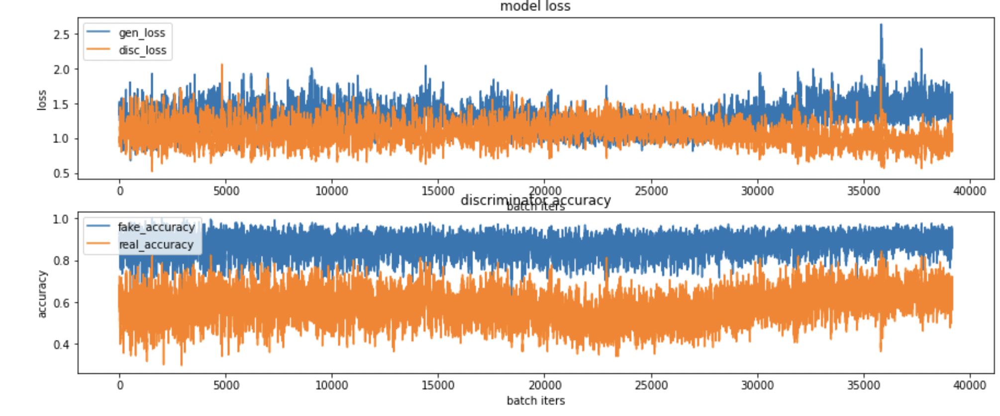

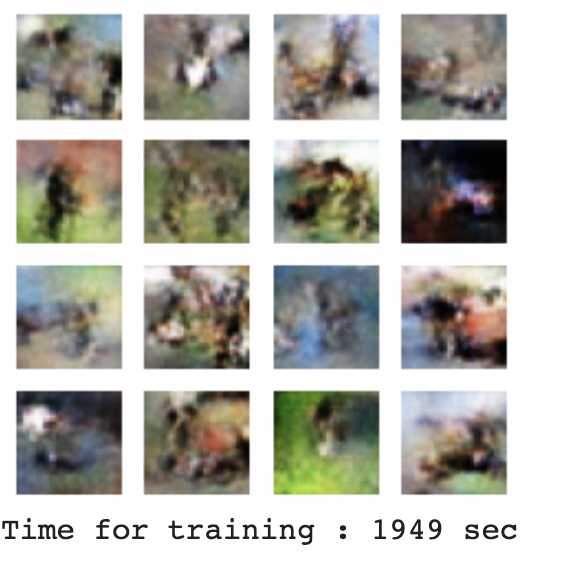

## 3) dropout
- dropout의 값을 0.3에서 0.4로 변경시켰다
- 다른 부분을 개선해서 학습할때보다는 가장 좋은 결과를 얻었다
- 현재 epoch =50과 200으로 학습시킨 것이다.
- 결과
  - loss값은 1에 수렴한다
  - fake_acc는 1에서 점차 내려가는 모습을 보이고 몇몇 지점은0.5까지 수렴한 부분이 보인다.
  - 이미지의 경우 형체 구분이 잘 안되는 상태이다.
- 그래도 가장 좋은 그래프를 보였다는 생각에 epoch =200으로 학습 시켜보았다.

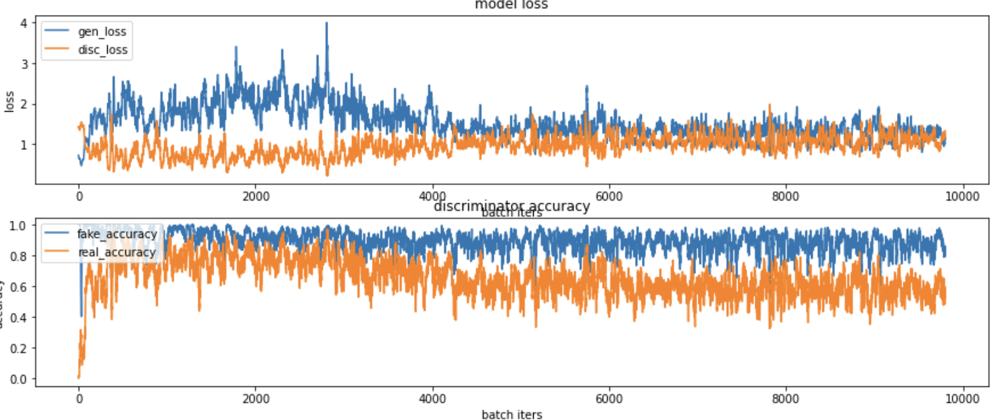

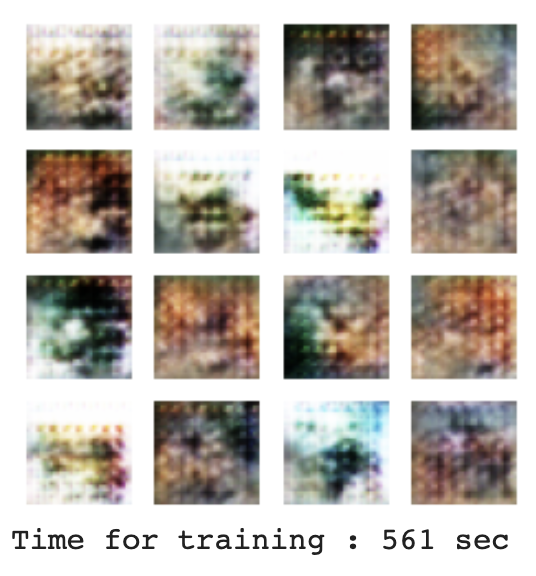

### dropout = 0.4로 고정 후 epoch =200으로 학습
- loss가 1에 수렴한듯 하나 갑자기 우상향을 하는 모습을 보였다
- fake_acc는 0.5에 수렴할 생각이 없어보인다.(뭘..더해야될까..)
- 이미지는 풍경정도 확인이 가능할지도?

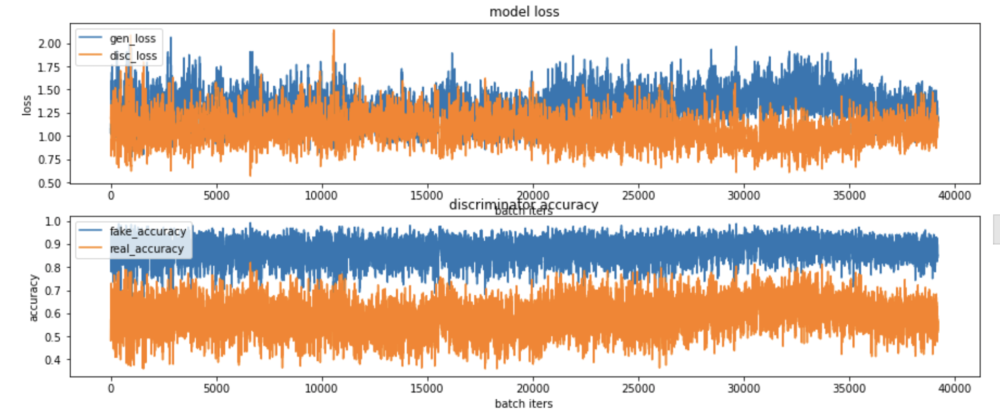

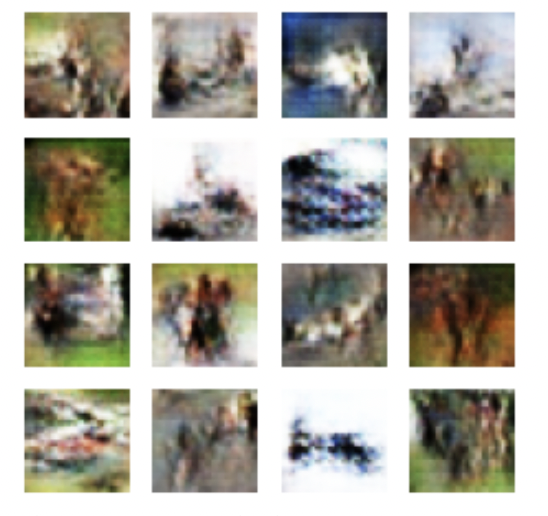

### dropout = 0.4로 고정 후 **epoch =500**으로 학습
- loss가 1에 수렴한 모습을 보인다
- fake_acc는 0.5에 수렴하지 않음
- 이미지는 다른 것에 비해 비교적 물체와 배경이 구분되는 정도이다.
(고대 벽화그림 같은 수준)
- epoch를 높일 수록 선명해지는 것은 확실하나 가장 최적화된 하이퍼파라미터를 이용하면 낮은 epoch에서도 선명하게 나올 수 있을 것같다.


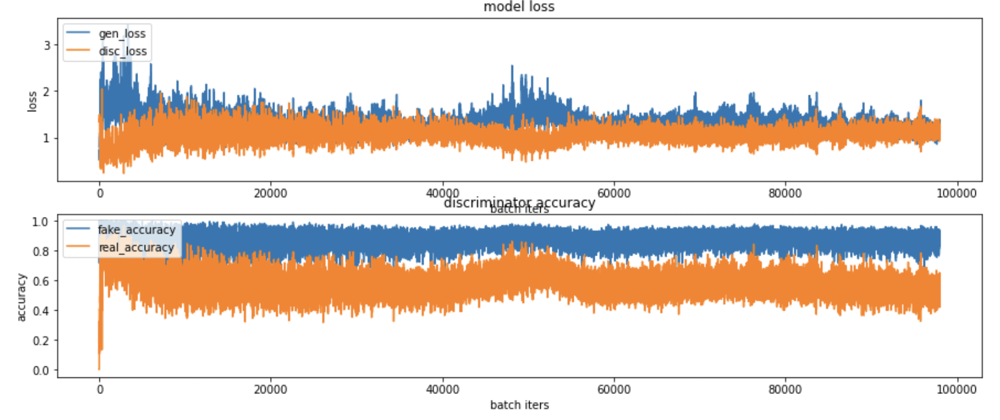

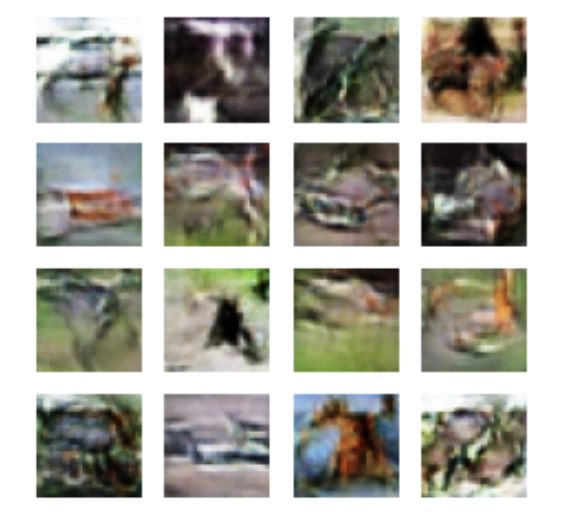

## 회고
(1) 결과
- 다양한 부분 개선시켜보았을 때 dropout을 0.3에서 0.4로 변화시켰을 때 그래프의 수치가 좋아보였다.
- epoch을 50으로 고정시키고 다른 부분들을 개선 시킨 것은 무조건 epoch만 늘린다고 좋은 것이 아닐 수 있겠다는 생각을 했다.
- epoch = 50인 상태에서 그나마 괜찮은 그래프를 보이면 그때 epoch의 값을 조절해보았다. epoch =200, 500으로 이미지를 확인해보았고 epoch의 값이 커질 수록 이미지의 물체가 뚜렷해지면서 식별정도가 나아짐을 알 수있었다

(2) 참고한 내용
- 학습이 잘 되지 않거나, mode collapse가 발생하는 경우 학습률(learning rate)을 조절해 볼 필요가 있다. 또한 일반적으로 GAN에서는 Adam optimizer가 많이 사용된다. 하지만 이 또한 어떠한 loss를 사용하는지에 따라서 조금씩 차이가 있다. 그리고 충분히 수렴한 뒤에는 epoch을 증가시켜도 생성되는 이미지의 quality가 더 이상 개선되지 않는다. 따라서 epoch이 증가함에 따라서 FID를 계산해보는 방식으로 학습의 진행 과정을 확인해 볼 수도 있다.

### DCGAN  
DCGAN은 3가지 특징을 지닌 CNN 구조를 적용하였습니다.

첫째, Max Pooling To Strided Convolution
- Spatial Pooling은 down sample의 대표적인 기법입니다. 
따로 Max pooling layer을 넣어 spatial resolution을 낮춰주는 작업을 진행하고, 
- 이때, Max-pool은 미분이 불가능한 레이어 입니다. 
- DCGAN은 이 작업을 convolution 과정 안으로 넣었습니다. 그림에서와 같이 Spatial pooling이 Convolution을 통해 되기 때문에 Generator network에서 spatial downsampling 과정도 함께 학습시킬 수 있습니다. Discriminator에서는 spatial upsampling이 가능하게 바꿨습니다.   

둘째, Eliminate Fully-Connected Layers
- G에 noise vector z를 넣는 첫번째 layer와
D에서 output결과를 판단하는 마지막 softmaxlayer를 제외하고는 FC layers를 전부 제외했다고 합니다.

셋째, Batch Normalization 추가
- Gradient의 흐름이 deep한 model에서도 잘 흐르게끔 BN을 적용시켜줬답니다.
- 하지만, 모든 layer에 BN을 추가하면 문제가 생겼고, G의 output layer와 D의 input layer에는 BN을 넣지 않는다고 합니다.


## Reference
- https://ndb796.tistory.com/689
- https://zzcojoa.tistory.com/89?category=1035878
- https://turnoveranewleaf4me.tistory.com/44
- https://koreapy.tistory.com/917
- https://notebooks.githubusercontent.com/view/ipynb?browser=chrome&color_mode=auto&commit=cd5d5f4846ffb9aa33e4e9f20685c83ffb3a0792&device=unknown&enc_url=68747470733a2f2f7261772e67697468756275736572636f6e74656e742e636f6d2f61692d727469737469632f41494646454c2d50726f6a6563742f636435643566343834366666623961613333653465396632303638356338336666623361303739322f4578706c6f726174696f6e2f455031335f444347414e5f434946415231305f50726f6a6563742e6970796e62&logged_in=false&nwo=ai-rtistic%2FAIFFEL-Project&path=Exploration%2FEP13_DCGAN_CIFAR10_Project.ipynb&platform=android&repository_id=386171958&repository_type=Repository&version=99
- https://memesoo99.tistory.com/32
- https://memesoo99.tistory.com/32 [미미로그:티스토리]